In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

%matplotlib inline

In [3]:
!pwd

/home/sarahesayas/DATA-MINING/Lectures


In [4]:
os.getcwd()

'/home/sarahesayas/DATA-MINING/Lectures'

In [5]:
# os.chdir("") # cd 

In [6]:
!ls

L1-Data-Understanding.ipynb   brick.png  puppy.png
L2-Image-Preprocessing.ipynb  cat.png	 rainbow.png


## Import the Image

In [7]:
pic=Image.open("puppy.png")

ValueError: Could not save to JPEG for display

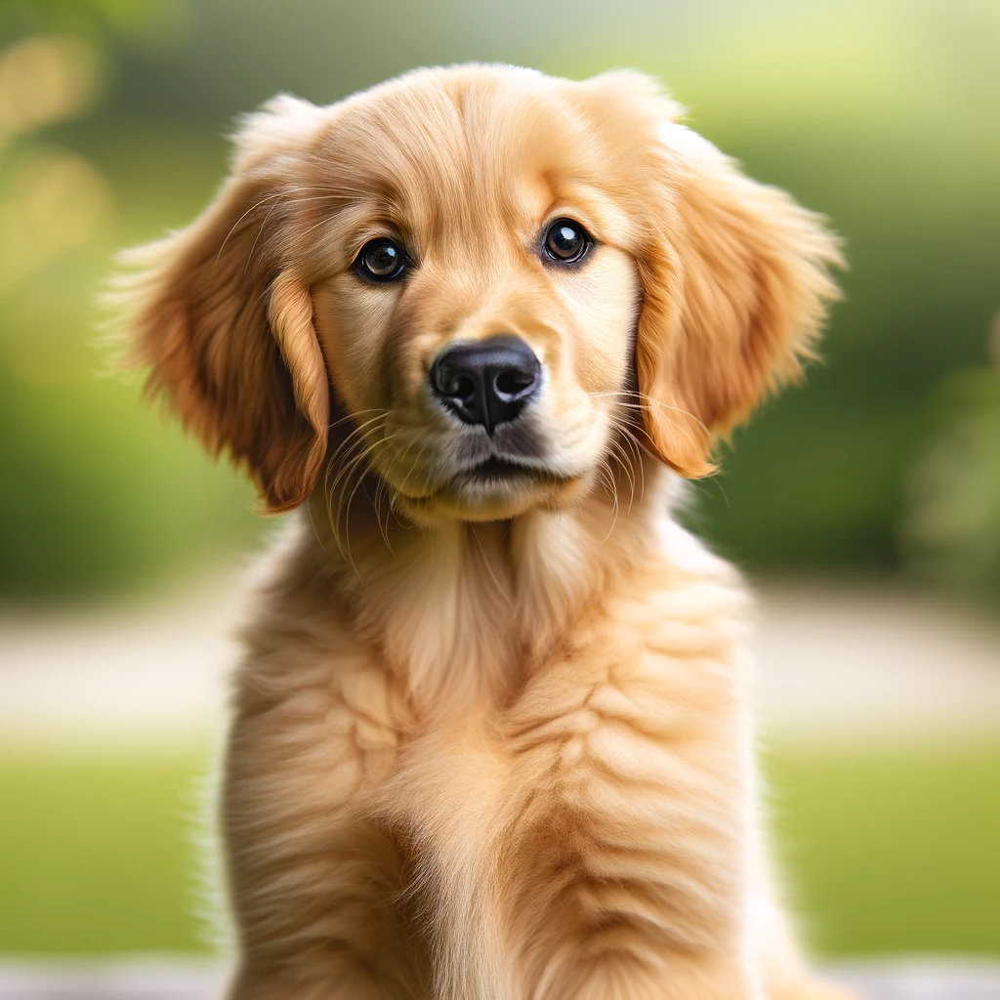

In [8]:
pic

## Convert it to Array

In [9]:
pic_array=np.asarray(pic)

pic_array.shape

(1024, 1024, 4)

height, width, depth

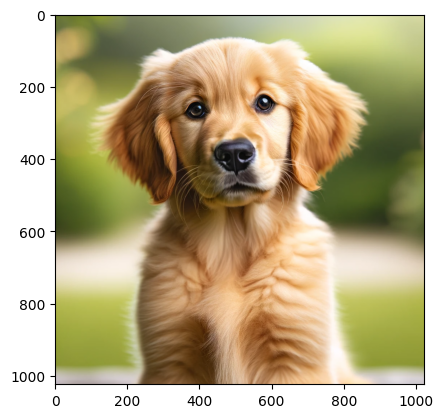

In [10]:
plt.imshow(pic_array)

## Create a Copy of this Image

In [11]:
pic_c = pic_array.copy()

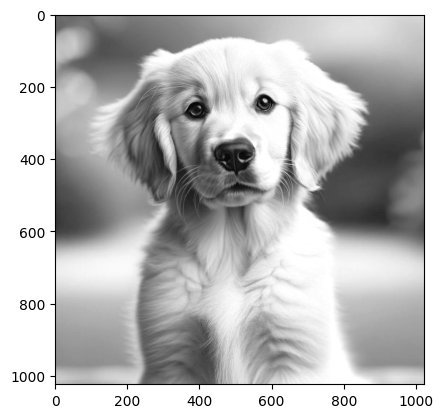

In [12]:
plt.imshow(pic_c[:,:,0], cmap="gray")
# [:,:,0] = I need ALL the pixels in height and width
# RGB (Red, Green, Blue). When we say 0, we are dealing with red

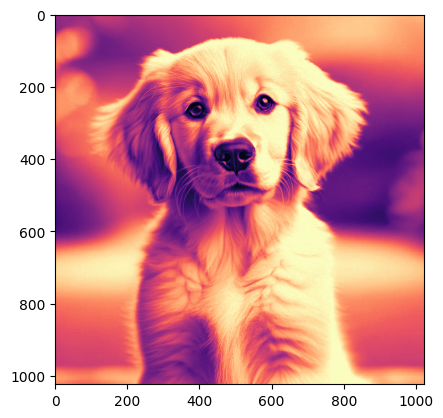

In [13]:
plt.imshow(pic_c[:,:,0], cmap="magma")

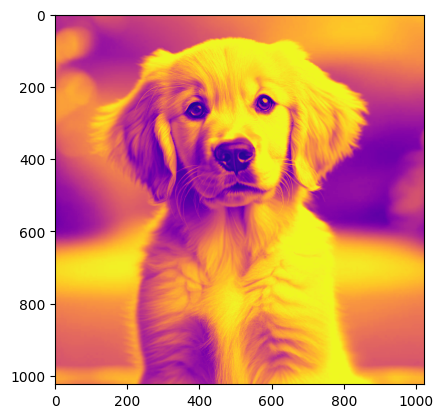

In [14]:
plt.imshow(pic_c[:,:,0], cmap="plasma")

We do this to extract features from the image. (Shape of ear, shape of nose, shape of eyes)

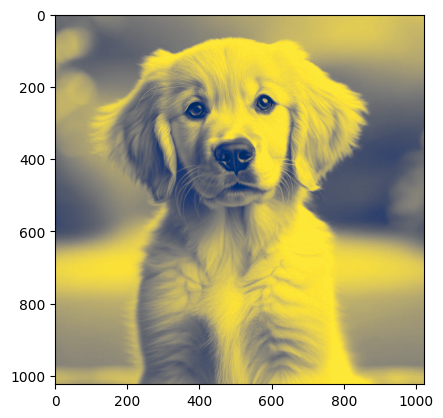

In [15]:
# Uniform sequential color maps
plt.imshow(pic_c[:,:,0], cmap="cividis")

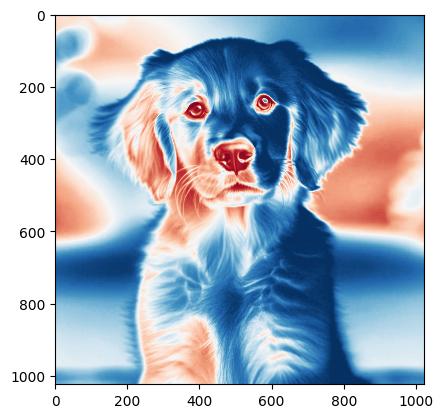

In [16]:
# Diverging color maps
# plt.imshow(pic_c[:,:,0], cmap="PiYG")
plt.imshow(pic_c[:,:,0], cmap="RdBu")

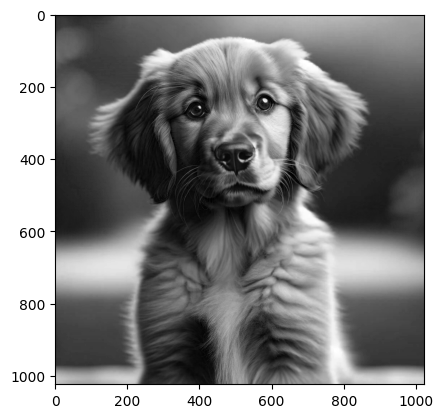

In [17]:
plt.imshow(pic_c[:,:,2], cmap="gray")

## Slicing/Zooming In

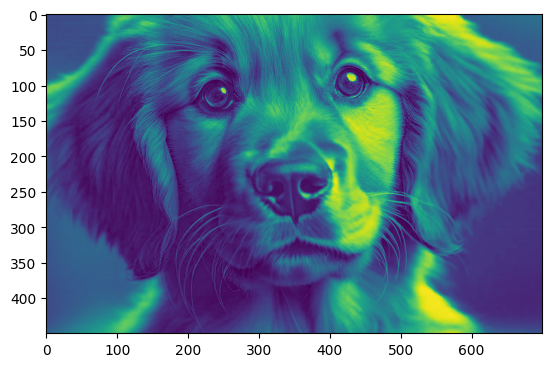

In [18]:
plt.imshow(pic_c[150:600, 150:850, 2])

## Lets Remove the Green Channel

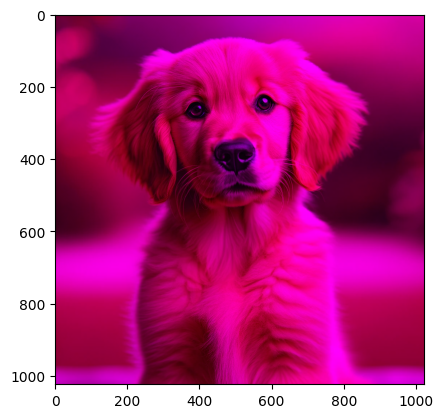

In [19]:
pic_c[:,:,1]=0
plt.imshow(pic_c)

## Let's Remove the Blue Channel

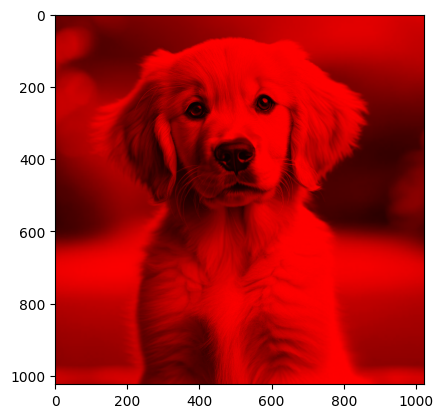

In [20]:
pic_c[:,:,2]=0
plt.imshow(pic_c)

## OpenCV
Open source computer vision, a library I think

In [20]:
# Import the library

In [21]:
import cv2

In [22]:
img=cv2.imread("puppy.png")

In [23]:
img.shape

(1024, 1024, 3)

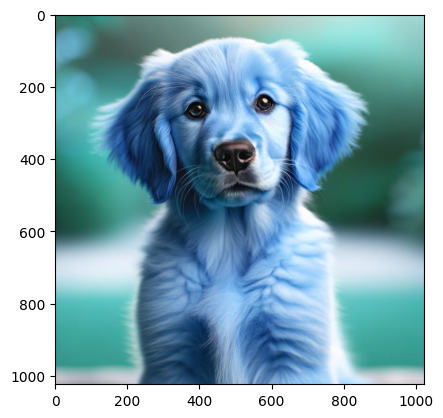

In [24]:
plt.imshow(img)

In [37]:
# In matplotlib: RGB: Red, Green, Blue

# In OpenCV: BGR: Blue, Green, Red

## So let's convert image from BGR to RGB

In [25]:
fixed_img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

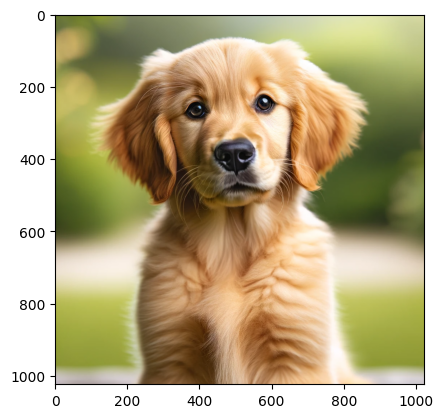

In [26]:
plt.imshow(fixed_img)

## Read the File as Grayscale

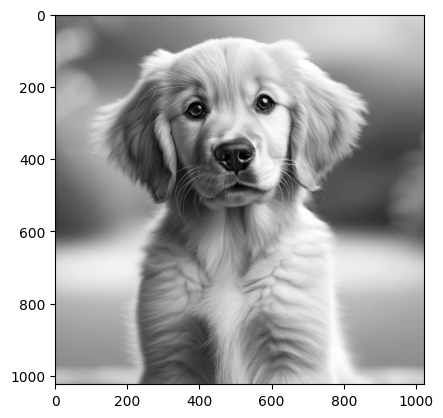

In [28]:
img_gray = cv2.imread("puppy.png", cv2.IMREAD_GRAYSCALE)
plt.imshow(img_gray, cmap="gray")

In [29]:
img_gray.shape
# No channel, (Height, Width), no (Height, Width, Channel)

(1024, 1024)

In [32]:
img_gray.min()
# What's my smallest pixel value (blackest)?

0

In [33]:
img_gray.max()
# What's my largest pixel value (white)?

255

## Resizing

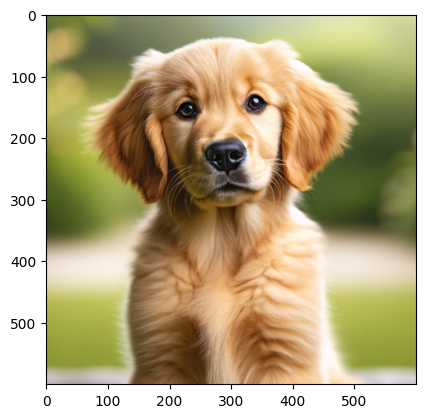

In [34]:
new_image = cv2.resize(fixed_img, (600,600))
plt.imshow(new_image)

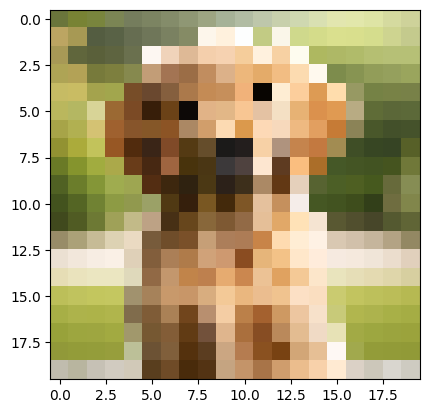

In [35]:
new_image = cv2.resize(fixed_img, (20,20))
plt.imshow(new_image)
# The lower the size, the blurrier the pic

### Lets Resize it By Ratio

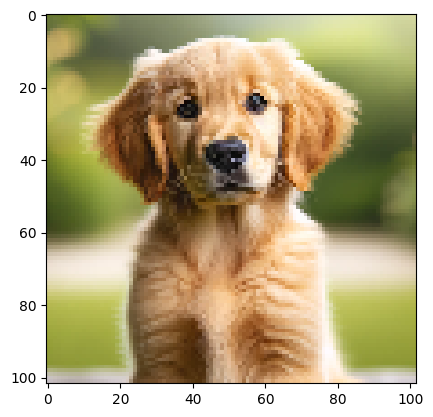

In [37]:
# Reduce your image size by 90%
w_ratio=0.1
l_ratio=0.1 

n_img = cv2.resize(fixed_img, (0,0), fixed_img, w_ratio, l_ratio)
plt.imshow(n_img)

### Flip the Image

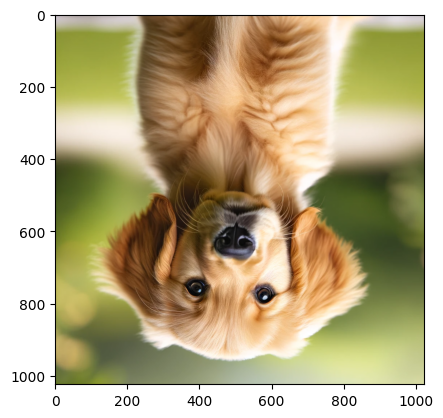

In [38]:
f_img = cv2.flip(fixed_img, 0)
plt.imshow(f_img)

## Basic Image Enhancement

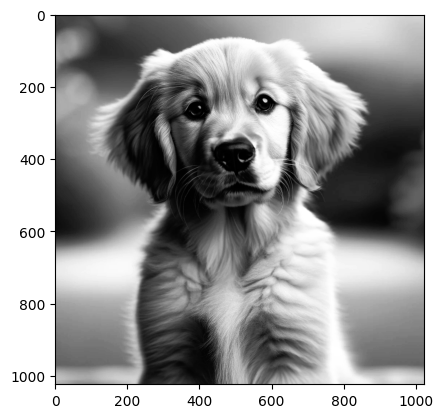

In [39]:
img_gray = cv2.imread("puppy.png", cv2.IMREAD_GRAYSCALE)
# Improve the contrast of the image
equalized_img = cv2.equalizeHist(img_gray)

plt.imshow(equalized_img, cmap='gray')

## Save it as a New Image

In [40]:
cv2.imwrite("Newdog.jpg", fixed_img)
# Saves in the current director

True

# Image Thresholding
A way = segmenting image

In [41]:
!ls

L1-Data-Understanding.ipynb   Newdog.jpg  cat.png    rainbow.png
L2-Image-Preprocessing.ipynb  brick.png   puppy.png


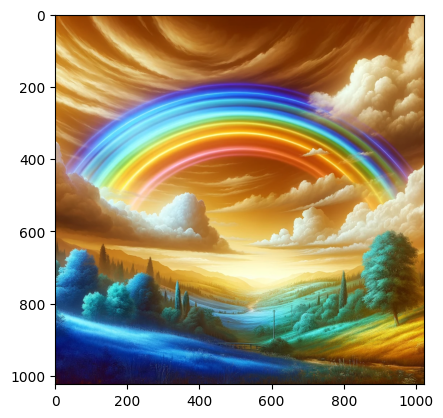

In [44]:
img=cv2.imread("rainbow.png")
plt.imshow(img)

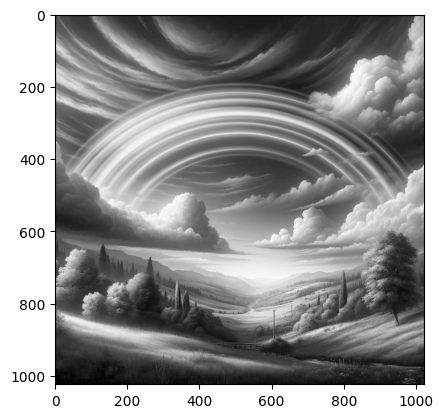

In [46]:
# Adding the 0 Flag to read the image in black and white

img=cv2.imread("rainbow.png", 0)
plt.imshow(img, cmap="gray")

## Different Threshold Types

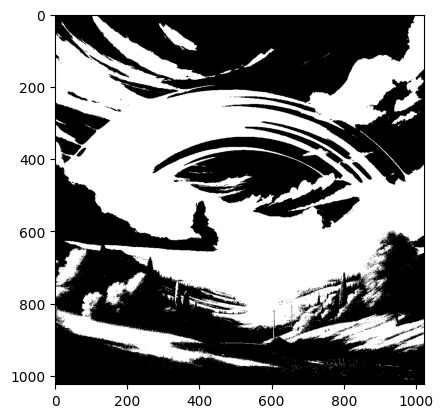

In [47]:
# 1. BINARY

ert, thresh1 = cv2.threshold(img,127,255, cv2.THRESH_BINARY)
plt.imshow(thresh1, cmap="gray")

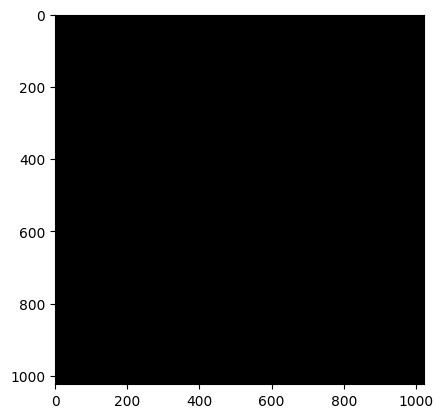

In [49]:
ert, thresh1 = cv2.threshold(img,127,255, cv2.THRESH_MASK) # Changed THRESH_BINARY to THRESH_MASK
plt.imshow(thresh1, cmap="gray")

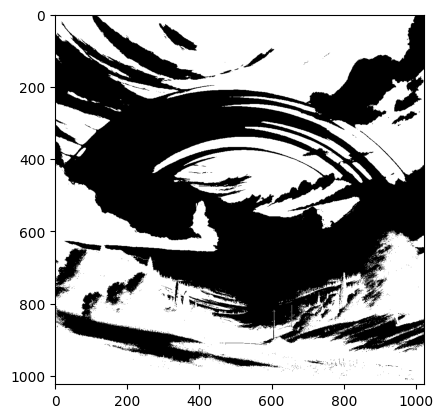

In [50]:
# Changed THRESH_BINARY to THRESH_BINARY_INV
# This changes black to white and vice versa
ert, thresh2 = cv2.threshold(img,127,255, cv2.THRESH_BINARY_INV)
plt.imshow(thresh2, cmap="gray")

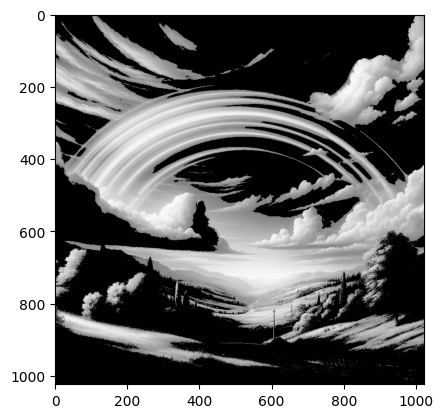

In [51]:
ert, thresh0 = cv2.threshold(img,127,255, cv2.THRESH_TOZERO)
plt.imshow(thresh0, cmap="gray")

# Smoothing and Blurring Image

In [52]:
# (np.float32)/255 is normalizing it, DIVIDING IT BY MAX
def load_img():
    img = cv2.imread("brick.png").astype(np.float32)/255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [53]:
def display_img(img):
    fig=plt.figure(figsize=(12,10))
    ax=fig.add_subplot(111)
    ax.imshow(img)

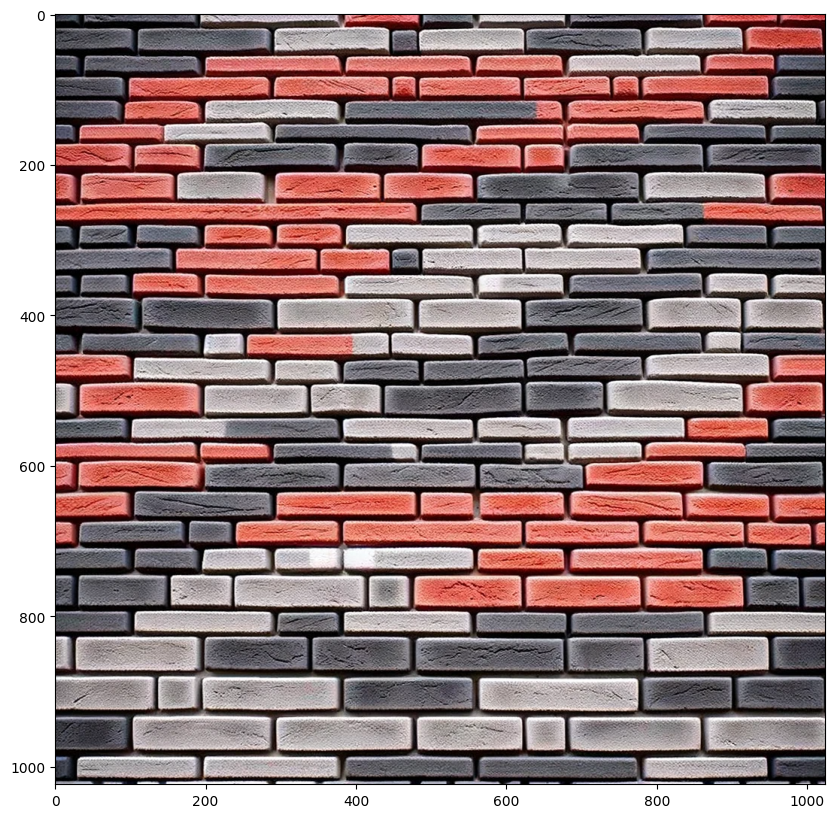

In [55]:
i = load_img()
display_img(i)

## Practical effect of increasing brightness

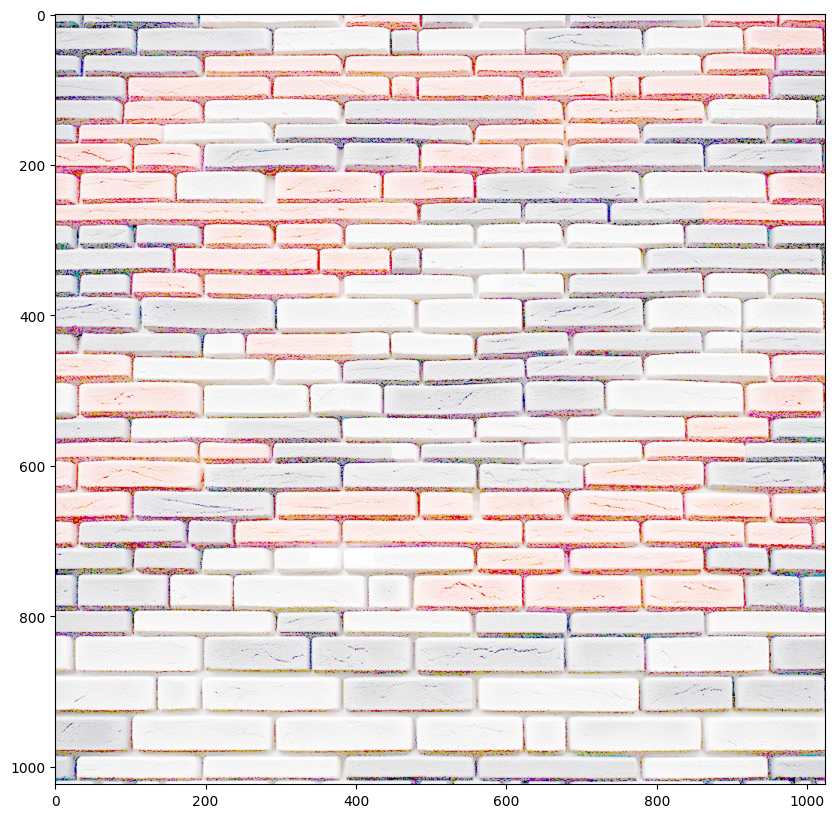

In [56]:
img = load_img()

gamma = 0.1

effected_image = np.power(img, gamma)
display_img(effected_image)

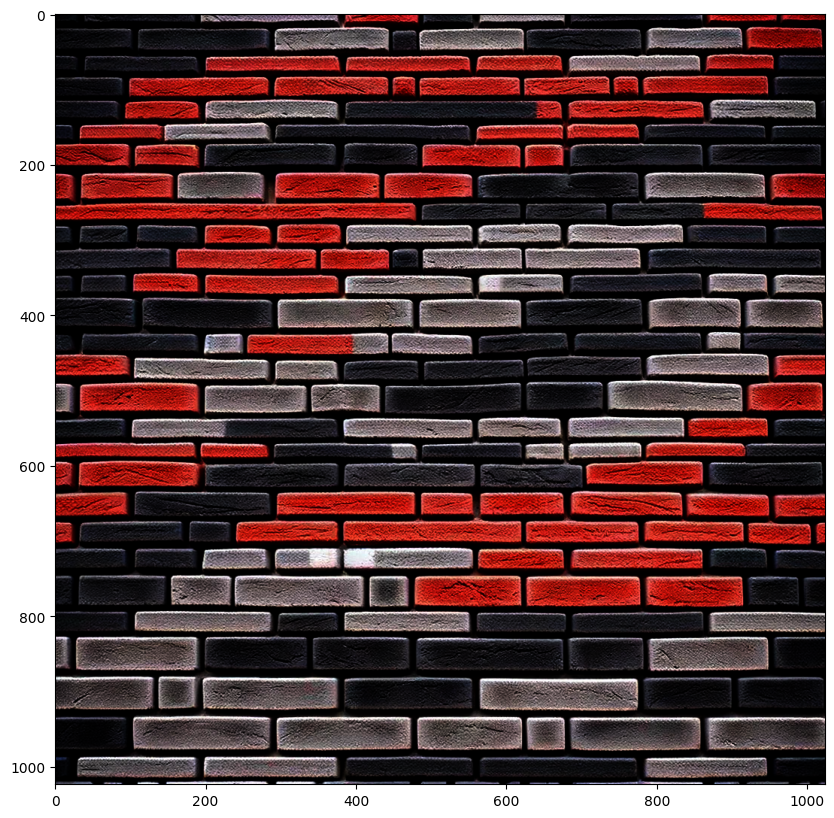

In [64]:
# Let's change gamma value to make it less bright
gamma = 3.0

effected_image = np.power(img, gamma)
display_img(effected_image)

# Edge Detection

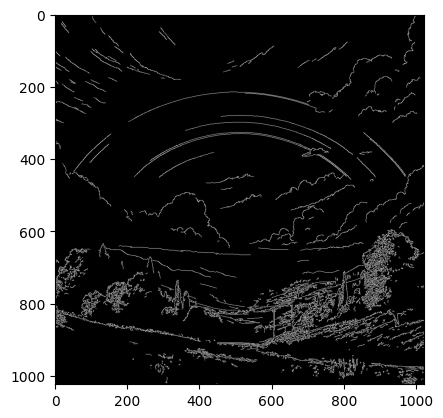

In [65]:
img = cv2.imread("rainbow.png", 0)

# Canny edge detection, is an algorithm
edges = cv2.Canny(img, 100, 200)

# Display the image

plt.imshow(edges, cmap="gray")

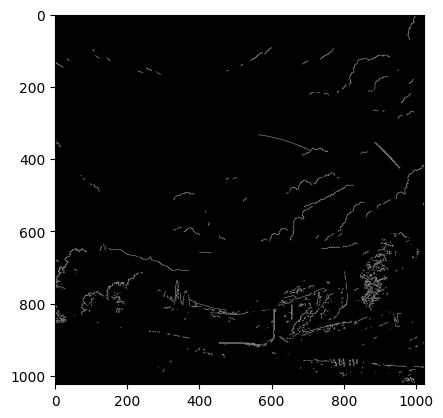

In [67]:
# Lets change that 100 in the Canny() to 300 and see how if affects edges
edges = cv2.Canny(img, 300, 200)
plt.imshow(edges, cmap="gray")

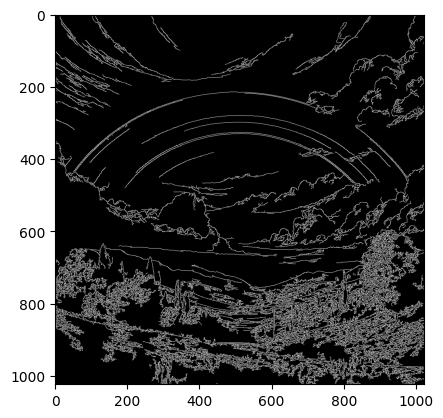

In [68]:
edges = cv2.Canny(img, 5, 200)
plt.imshow(edges, cmap="gray")

## Edge Preservation Filtering
Reduce the noise but maintain the quality of all the features

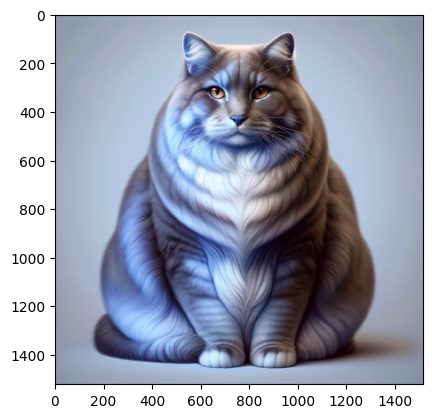

In [69]:
cat = cv2.imread("cat.png")

plt.imshow(cat)

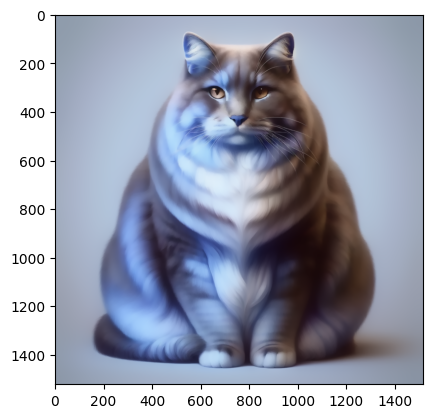

In [77]:
# Let's remove the noise in the image
# Play around with parameters to see what they do

epf_image = cv2.edgePreservingFilter(cat, flags=1, sigma_s=60, sigma_r=0.4)
plt.imshow(epf_image)

# Feature Extraction

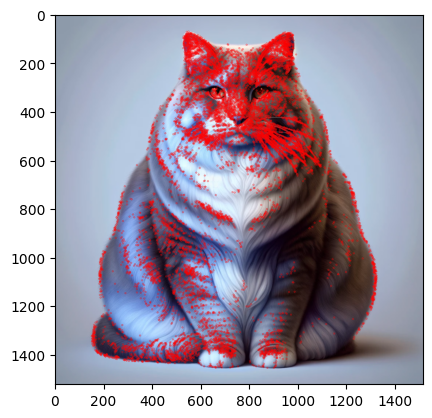

In [78]:
# Fast Feature Detector
fast = cv2.FastFeatureDetector_create()

# Detect the key points
keypoints = fast.detect(cat, None)

# Draw keypoints on the image
img_with_keypoints = cv2.drawKeypoints(cat, keypoints, None, color=(255,0,0))

plt.imshow(img_with_keypoints)

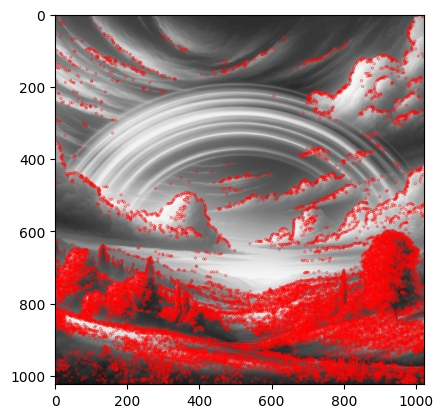

In [79]:
keypoints = fast.detect(img, None)

img_with_keypoints = cv2.drawKeypoints(img, keypoints, None, color=(255,0,0))

plt.imshow(img_with_keypoints)

# Gradients

In [80]:
img = cv2.imread("cat.png", 0)

In [84]:
def display_img(img):
    fig=plt.figure(figsize=(12,10))
    ax=fig.add_subplot(111)
    ax.imshow(img, cmap="gray")

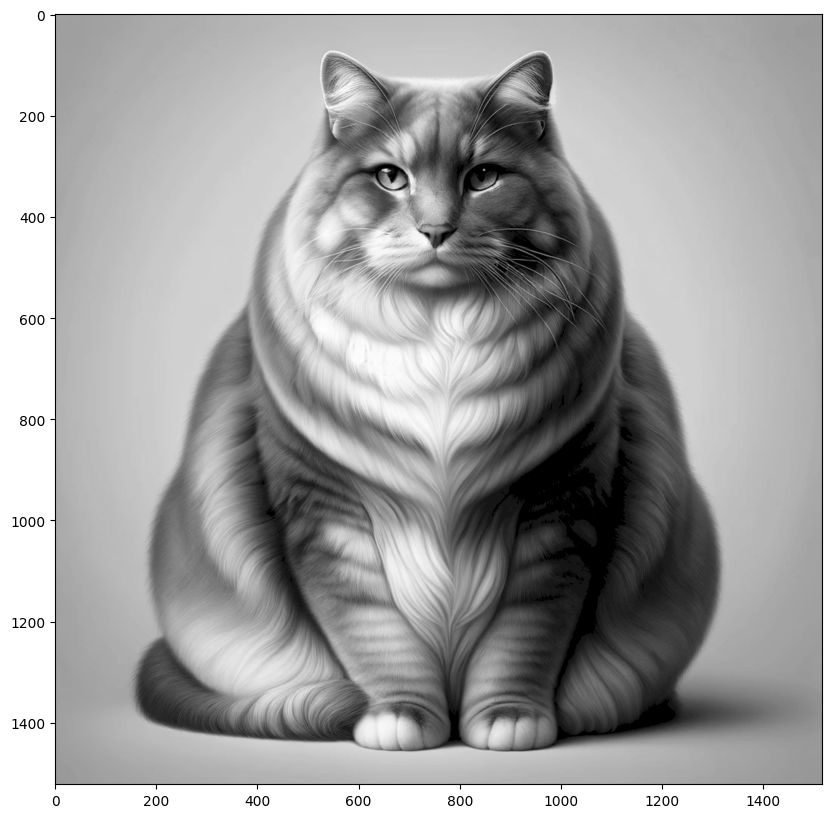

In [85]:
display_img(img)

In [86]:
sobelx = cv2.Sobel(img, cv2.CV_64F,1, 0, ksize=5)
sobely = cv2.Sobel(img, cv2.CV_64F,0, 1, ksize=5)

lablacian=cv2.Laplacian(img, cv2.CV_64F)

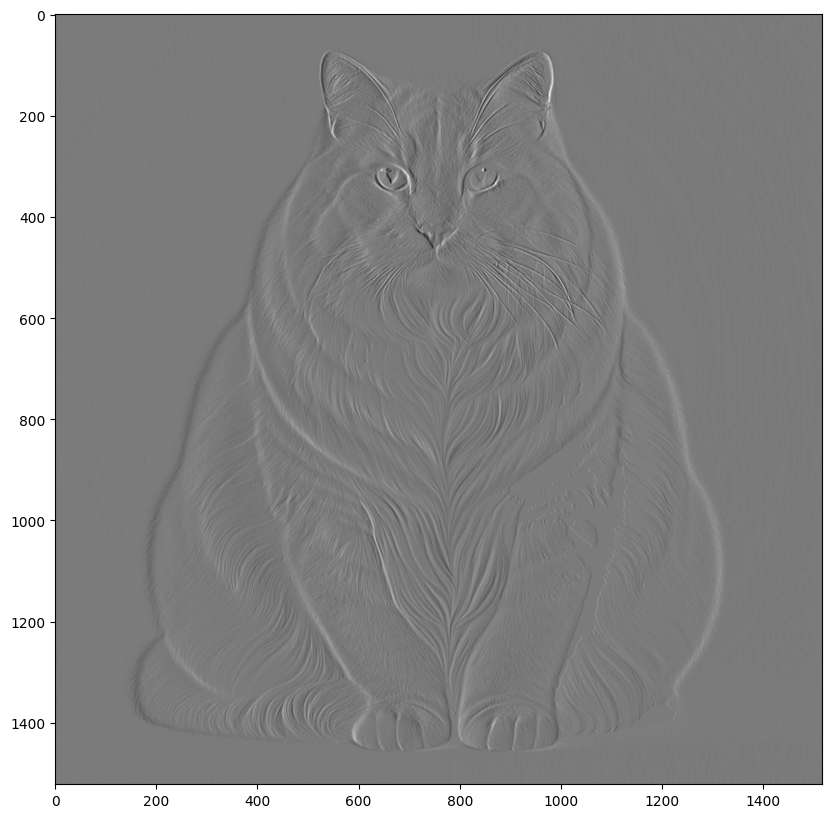

In [87]:
display_img(sobelx)

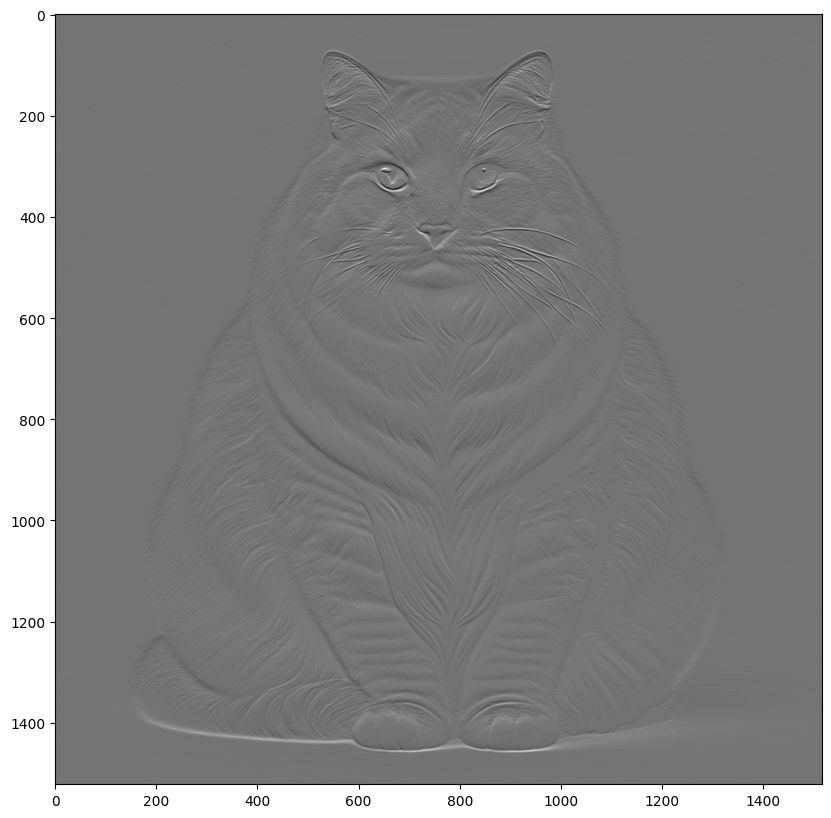

In [88]:
display_img(sobely)

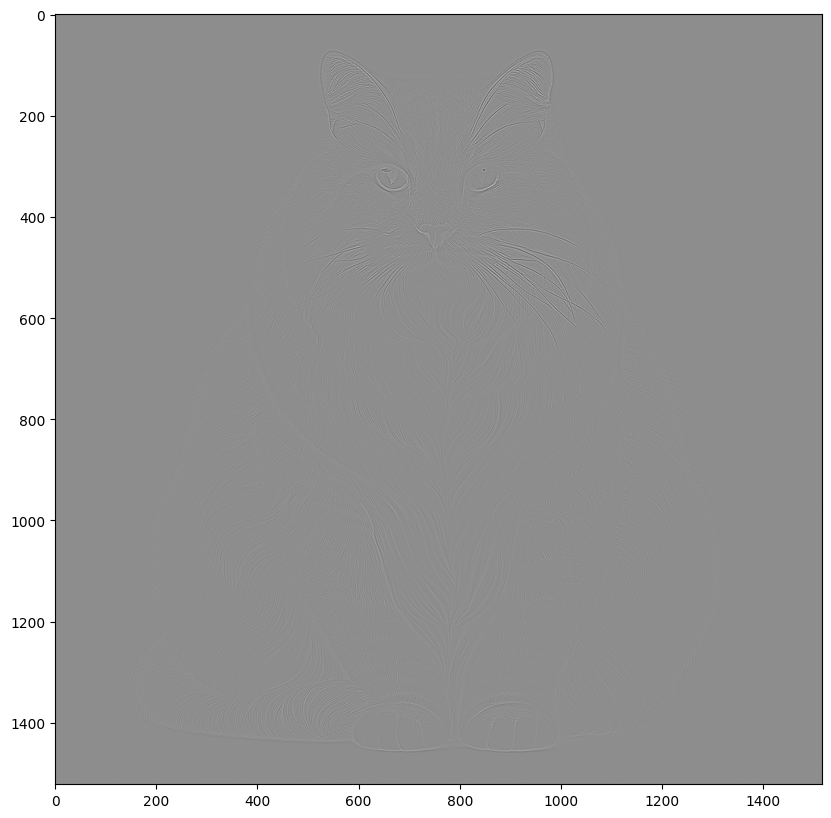

In [90]:
display_img(lablacian)